# EDA

In [1]:
import numpy                 as np
import pandas                as pd
import matplotlib.pyplot     as plt
import seaborn               as sns
import sklearn.metrics       as Metrics
import pandas                as pd
import matplotlib            as mpl


import folium  
from folium.plugins import HeatMap
import geopandas
import branca

In [2]:
import json
import requests
import os
import calendar
import datetime

In [3]:
# set matplotlib defaults
%matplotlib inline
sns.set()
plt.rcParams["figure.figsize"] = (15,6)
mpl.rc('axes', labelsize=18)
mpl.rc('xtick', labelsize=16)
mpl.rc('ytick', labelsize=16)
plt.rc('figure', titlesize=18)
plt.style.use('seaborn-darkgrid')

## Data loading and preparation

In [4]:
# read dataset
data_folder = '../data'
accidents_file = os.path.join(data_folder, 'siniestros_bogota_historico.csv')
accidents = pd.read_csv(accidents_file,sep=',')
accidents.head()

,X,Y,OBJECTID,FORMULARIO,CODIGO_ACCIDENTE,ANO_OCURRENCIA_ACC,DIRECCION,GRAVEDAD,CLASE_ACC,LOCALIDAD_GEO,LOCALIDAD,FECHA_HORA_ACC,CIV,PK_CALZADA
0,-74.039690,4.759877,1001,A00728405,360471,2010,AK 18A-CL 182 58,SOLO DANOS,CHOQUE,USAQUEN,USAQUEN,2010-05-25T20:10:00.000Z,1007130.0,91019224.0
1,-74.114296,4.615476,1002,A00408972,305838,2008,TR 49-3 02,SOLO DANOS,CHOQUE,PUENTE ARANDA,PUENTE ARANDA,2008-09-30T07:00:00.000Z,16004607.0,195361.0
2,-74.105296,4.509792,1003,A000341903,4437952,2016,CL 80A-KR 1 SE 02,CON HERIDOS,CHOQUE,USME,USME,2016-02-27T16:20:00.000Z,5002841.0,149316.0
3,-74.167225,4.631051,1004,A000554581,4472304,2017,AV AVENIDA CIUDAD DE CALI-CL 42 S 02,CON HERIDOS,ATROPELLO,KENNEDY,KENNEDY,2017-02-09T16:45:00.000Z,8004447.0,66217.0
4,-74.121790,4.603106,1005,A000763908,4512837,2018,AV AVENIDA PRIMERA DE MAYO-KR 50A 14,CON HERIDOS,CHOQUE,PUENTE ARANDA,PUENTE ARANDA,2018-03-25T12:10:00.000Z,16003102.0,239094.0


In [5]:
# Column renaming
cols = ['x', 'y', 'object_id', 'form', 'accident_id', 'year' , 
        'address', 'severity', 'accident_type', 'borough_geo', 
        'borough', 'timestamp', 'civ', 'pk']
accidents.columns = cols
accidents.timestamp = pd.to_datetime(accidents.timestamp, infer_datetime_format=True)

In [6]:
accidents.head(3)

,x,y,object_id,form,accident_id,year,address,severity,accident_type,borough_geo,borough,timestamp,civ,pk
0,-74.039690,4.759877,1001,A00728405,360471,2010,AK 18A-CL 182 58,SOLO DANOS,CHOQUE,USAQUEN,USAQUEN,2010-05-25 20:10:00+00:00,1007130.0,91019224.0
1,-74.114296,4.615476,1002,A00408972,305838,2008,TR 49-3 02,SOLO DANOS,CHOQUE,PUENTE ARANDA,PUENTE ARANDA,2008-09-30 07:00:00+00:00,16004607.0,195361.0
2,-74.105296,4.509792,1003,A000341903,4437952,2016,CL 80A-KR 1 SE 02,CON HERIDOS,CHOQUE,USME,USME,2016-02-27 16:20:00+00:00,5002841.0,149316.0


In [7]:
accidents.severity.unique()

array(['SOLO DANOS', 'CON HERIDOS', 'CON MUERTOS', nan], dtype=object)

In [8]:
accidents.accident_type.unique()

array(['CHOQUE', 'ATROPELLO', 'OTRO', 'CAIDA DE OCUPANTE', 'VOLCAMIENTO',
       nan, 'AUTOLESION', 'INCENDIO'], dtype=object)

In [9]:
# Replace names to english
accidents.replace({'SOLO DANOS': 'Material damage', 
                   'CON HERIDOS': 'Injury', 'CON MUERTOS': 'Fatality'}, inplace=True)
accidents.replace({'CHOQUE': 'Crash', 'ATROPELLO': 'Run over', 'OTRO': 'Other', 
                   'CAIDA DE OCUPANTE':'Occupant fall', 'VOLCAMIENTO':'Rollover', 'AUTOLESION':'Self injury',
                  'INCENDIO':'Fire'}, inplace=True)

In [10]:
accidents.severity.unique()

array(['Material damage', 'Injury', 'Fatality', nan], dtype=object)

In [11]:
accidents.accident_type.unique()

array(['Crash', 'Run over', 'Other', 'Occupant fall', 'Rollover', nan,
       'Self injury', 'Fire'], dtype=object)

In [12]:
print(accidents.borough.unique())

['USAQUEN' 'PUENTE ARANDA' 'USME' 'KENNEDY' 'BARRIOS UNIDOS' 'CHAPINERO'
 'SANTA FE' 'SUBA' 'ENGATIVA' 'CANDELARIA' 'BOSA' 'FONTIBON' 'TEUSAQUILLO'
 'LOS MARTIRES' 'ANTONIO NARIÑO' 'TUNJUELITO' 'RAFAEL URIBE URIBE'
 'SAN CRISTOBAL' 'CIUDAD BOLIVAR' 'SUMAPAZ']


In [13]:
print(accidents.borough_geo.unique())

['USAQUEN' 'PUENTE ARANDA' 'USME' 'KENNEDY' 'BARRIOS UNIDOS' 'CHAPINERO'
 'SANTA FE' 'SUBA' 'ENGATIVA' 'CANDELARIA' 'BOSA' 'FONTIBON' 'TEUSAQUILLO'
 'LOS MARTIRES' 'RAFAEL URIBE URIBE' 'TUNJUELITO' 'SAN CRISTOBAL'
 'ANTONIO NARINO' 'CIUDAD BOLIVAR' 'SUMAPAZ' nan 'CANDELARIO']


In [14]:
# Set difference between borough_geo and borough to spot different names
print(set(accidents.borough_geo.unique()) - set(accidents.borough.unique()))

{nan, 'ANTONIO NARINO', 'CANDELARIO'}


In [15]:
# correct namig differences
dic = {'ANTONIO NARINO': 'ANTONIO NARIÑO', 'CANDELARIO':'CANDELARIA'}
accidents.borough_geo.replace(dic, inplace=True)
print(set(accidents.borough_geo.unique()) - set(accidents.borough.unique()))

{nan}


In [16]:
accidents[accidents.borough != accidents.borough_geo].head(3)

,x,y,object_id,form,accident_id,year,address,severity,accident_type,borough_geo,borough,timestamp,civ,pk
6,-74.053575,4.644176,1007,727119100,33903,2007,CL 63-0 FRENTE AL PARQUE SIMON BOLIVAR,Injury,Other,CHAPINERO,BARRIOS UNIDOS,2007-07-31 07:50:00+00:00,2001553.0,31860.0
11,-74.040962,4.681181,1012,726576300,28509,2007,CL 100-8A 59,Material damage,Crash,CHAPINERO,USAQUEN,2007-06-06 07:35:00+00:00,1005836.0,35247.0
21,-74.089037,4.687408,1022,A00666167,352406,2010,AK 68-CL75 02,Material damage,Crash,ENGATIVA,BARRIOS UNIDOS,2010-02-27 15:30:00+00:00,10007575.0,213515.0


Why are there differences between  ```borough``` and  ```borough_geo```?

### Processing null values

In [17]:
pd.DataFrame(accidents.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 405348 entries, 0 to 405347
Data columns (total 14 columns):
 #   Column         Non-Null Count   Dtype              
---  ------         --------------   -----              
 0   x              405348 non-null  float64            
 1   y              405348 non-null  float64            
 2   object_id      405348 non-null  int64              
 3   form           405348 non-null  object             
 4   accident_id    405348 non-null  int64              
 5   year           405348 non-null  int64              
 6   address        405348 non-null  object             
 7   severity       405345 non-null  object             
 8   accident_type  405165 non-null  object             
 9   borough_geo    405292 non-null  object             
 10  borough        405348 non-null  object             
 11  timestamp      405348 non-null  datetime64[ns, UTC]
 12  civ            403141 non-null  float64            
 13  pk             395246 non-nul

""


In [18]:
accidents.shape

(405348, 14)

In [19]:
accidents[accidents.borough_geo.isna()].head(10)

,x,y,object_id,form,accident_id,year,address,severity,accident_type,borough_geo,borough,timestamp,civ,pk
43610,-74.200353,4.600041,44611,A000763096,4512183,2018,AV AVENIDA DEL SUR-KR 75 2,Material damage,Crash,NaN,BOSA,2018-03-17 13:10:00+00:00,50006605.0,NaN
51771,-74.189334,4.597365,49772,A000278796,4431414,2015,AV AVENIDA DEL SUR-CL 68B S 12,Material damage,Crash,NaN,BOSA,2015-12-05 18:19:00+00:00,NaN,NaN
57181,-74.184334,4.596344,50182,A000470334,4456641,2016,AV AVENIDA DEL SUR-CL 67 S 05,Material damage,Crash,NaN,BOSA,2016-09-06 07:20:00+00:00,50001542.0,50017280.0
59401,-74.209634,4.605810,63402,A000757148,4506585,2018,AV AVENIDA DEL SUR-KR 78I 50,Injury,Crash,NaN,BOSA,2018-01-28 07:15:00+00:00,NaN,NaN
61759,-74.188436,4.597227,58760,A000041336,4401683,2015,AV AVENIDA DEL SUR-KR 67 02,Material damage,Crash,NaN,BOSA,2015-01-07 07:00:00+00:00,NaN,NaN
92323,-74.189993,4.597511,91324,A000690766,4499762,2017,AV AVENIDA DEL SUR-KR 69 2,Material damage,Crash,NaN,BOSA,2017-11-14 22:45:00+00:00,NaN,NaN
95960,-74.174842,4.684391,90961,A000691373,4502681,2017,CL 13-KR 133 02,Material damage,Crash,NaN,FONTIBON,2017-12-12 15:30:00+00:00,NaN,NaN
105943,-74.193769,4.598334,105944,A000763032,4512019,2018,KR 77G-CL 70B S 2,Injury,Crash,NaN,BOSA,2018-03-20 09:30:00+00:00,NaN,NaN
113310,-74.188844,4.597275,118311,A000758699,4508424,2018,AV AVENIDA DEL SUR-CL 68 S 2,Material damage,Crash,NaN,TUNJUELITO,2018-02-14 06:05:00+00:00,7007820.0,61280.0
118097,-74.184194,4.596409,117098,A000551227,4468691,2016,AV AVENIDA DEL SUR-CL 66 S 02,Material damage,Crash,NaN,BOSA,2016-12-27 13:30:00+00:00,50001542.0,50017280.0


In [20]:
# fill nulls in borough_geo with values of borough
accidents.borough_geo.fillna(accidents.borough, inplace=True)

In [21]:
accidents[accidents.borough_geo.isna()]

,x,y,object_id,form,accident_id,year,address,severity,accident_type,borough_geo,borough,timestamp,civ,pk


In [22]:
accidents[accidents.severity.isna()]

,x,y,object_id,form,accident_id,year,address,severity,accident_type,borough_geo,borough,timestamp,civ,pk
18164,-74.053353,4.665094,22165,726842600,31151,2007,AK 11-81 0,NaN,Crash,CHAPINERO,CHAPINERO,2007-07-05 10:45:00+00:00,2000816.0,39188.0
38512,-74.055084,4.666617,41513,840468400,296624,2008,KR 13-81 52,NaN,Crash,CHAPINERO,CHAPINERO,2008-07-25 19:45:00+00:00,2000763.0,197523.0
258840,-74.065868,4.641508,255841,726841300,31144,2007,AV CARACAS-CL 54 0,NaN,Crash,CHAPINERO,CHAPINERO,2007-07-09 18:00:00+00:00,2001662.0,137699.0


In [23]:
# Fill null values in the severity column with the least severe of the accidents
accidents.severity.fillna('Material damage', inplace=True)

In [24]:
accidents[accidents.severity.isna()]

,x,y,object_id,form,accident_id,year,address,severity,accident_type,borough_geo,borough,timestamp,civ,pk


In [25]:
accidents[accidents.accident_type.isna()]

,x,y,object_id,form,accident_id,year,address,severity,accident_type,borough_geo,borough,timestamp,civ,pk
125,-74.075536,4.664511,1126,727639900,39096,2007,AV CIUDAD DE QUITO-CL 69 0,Material damage,NaN,BARRIOS UNIDOS,BARRIOS UNIDOS,2007-09-25 20:05:00+00:00,12002045.0,35893.0
9621,-74.064431,4.643908,10622,840010100,292297,2008,CL 57-13 02,Injury,NaN,CHAPINERO,CHAPINERO,2008-06-27 12:25:00+00:00,2002211.0,31778.0
10872,-74.041560,4.779383,11873,728149300,44165,2007,AU NORTE-220 0,Material damage,NaN,USAQUEN,USAQUEN,2007-11-09 18:30:00+00:00,1006455.0,2976.0
11646,-74.069099,4.648431,12647,840141900,293555,2008,AC 60-18A 48,Material damage,NaN,TEUSAQUILLO,CIUDAD BOLIVAR,2008-06-30 01:35:00+00:00,13000403.0,32394.0
16206,-74.089225,4.680316,16207,728093900,43619,2007,KR 69-71,Material damage,NaN,ENGATIVA,ENGATIVA,2007-11-02 17:30:00+00:00,10008472.0,41937.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369661,-74.103390,4.599371,371066,728726100,49377,2007,CL 1A-30,Material damage,NaN,LOS MARTIRES,PUENTE ARANDA,2007-12-29 08:35:00+00:00,14001143.0,240448.0
370833,-74.096357,4.685622,375238,828659300,432,2008,AV BOYACA-CL 70 89,Material damage,NaN,ENGATIVA,ENGATIVA,2008-01-12 19:10:00+00:00,10007937.0,42191.0
370912,-74.071954,4.668912,375317,728000500,42690,2007,AV CIUDAD DE QUITO-CL 74,Material damage,NaN,BARRIOS UNIDOS,BARRIOS UNIDOS,2007-10-26 11:15:00+00:00,12001580.0,38055.0
375972,-74.062777,4.645109,377377,833950800,3831,2008,CL 59-SUR 2,Material damage,NaN,CHAPINERO,BOSA,2008-02-29 13:00:00+00:00,2001516.0,32363.0


In [26]:
# which accidents are more common based on the severity
accidents.groupby('severity')['accident_type'].agg(pd.Series.mode)

severity
Fatality           Run over
Injury                Crash
Material damage       Crash
Name: accident_type, dtype: object

In [35]:
# Fill null values based on the most common accident according to severity

accidents.loc[((accidents.severity == 'Injury') & (accidents.accident_type.isna()))].accident_type = accidents.loc[((accidents.severity == 'Injury') & (accidents.accident_type.isna()))].accident_type.fillna('Crash')
accidents.loc[(accidents.severity == 'Fatality') & (accidents.accident_type.isna())].accident_type = accidents.loc[(accidents.severity == 'Fatality') & (accidents.accident_type.isna())].accident_type.fillna('Run over')
accidents.loc[(accidents.severity == 'Material damage') & (accidents.accident_type.isna())].accident_type = accidents.loc[(accidents.severity == 'Material damage') & (accidents.accident_type.isna())].accident_type.fillna('Crash')

In [36]:
accidents[accidents.accident_type.isna()]

,x,y,object_id,form,accident_id,year,address,severity,accident_type,borough_geo,borough,timestamp,civ,pk
125,-74.075536,4.664511,1126,727639900,39096,2007,AV CIUDAD DE QUITO-CL 69 0,Material damage,NaN,BARRIOS UNIDOS,BARRIOS UNIDOS,2007-09-25 20:05:00+00:00,12002045.0,35893.0
9621,-74.064431,4.643908,10622,840010100,292297,2008,CL 57-13 02,Injury,NaN,CHAPINERO,CHAPINERO,2008-06-27 12:25:00+00:00,2002211.0,31778.0
10872,-74.041560,4.779383,11873,728149300,44165,2007,AU NORTE-220 0,Material damage,NaN,USAQUEN,USAQUEN,2007-11-09 18:30:00+00:00,1006455.0,2976.0
11646,-74.069099,4.648431,12647,840141900,293555,2008,AC 60-18A 48,Material damage,NaN,TEUSAQUILLO,CIUDAD BOLIVAR,2008-06-30 01:35:00+00:00,13000403.0,32394.0
16206,-74.089225,4.680316,16207,728093900,43619,2007,KR 69-71,Material damage,NaN,ENGATIVA,ENGATIVA,2007-11-02 17:30:00+00:00,10008472.0,41937.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369661,-74.103390,4.599371,371066,728726100,49377,2007,CL 1A-30,Material damage,NaN,LOS MARTIRES,PUENTE ARANDA,2007-12-29 08:35:00+00:00,14001143.0,240448.0
370833,-74.096357,4.685622,375238,828659300,432,2008,AV BOYACA-CL 70 89,Material damage,NaN,ENGATIVA,ENGATIVA,2008-01-12 19:10:00+00:00,10007937.0,42191.0
370912,-74.071954,4.668912,375317,728000500,42690,2007,AV CIUDAD DE QUITO-CL 74,Material damage,NaN,BARRIOS UNIDOS,BARRIOS UNIDOS,2007-10-26 11:15:00+00:00,12001580.0,38055.0
375972,-74.062777,4.645109,377377,833950800,3831,2008,CL 59-SUR 2,Material damage,NaN,CHAPINERO,BOSA,2008-02-29 13:00:00+00:00,2001516.0,32363.0


## Dataset exploration

In [28]:
accidents.shape

(405348, 14)

In [37]:
accidents.describe()

,x,y,object_id,accident_id,year,civ,pk
count,405348.000000,405348.000000,405348.000000,4.053480e+05,405348.000000,4.031410e+05,3.952460e+05
mean,-74.098351,4.652490,202722.164128,2.775174e+06,2012.983824,1.338473e+07,7.622143e+06
std,0.038644,0.054166,117086.881644,3.434708e+06,3.816806,1.326624e+07,1.852757e+07
min,-74.364144,3.985384,1.000000,1.040000e+02,2007.000000,0.000000e+00,0.000000e+00
25%,-74.125038,4.613350,101337.750000,3.511648e+05,2010.000000,6.001842e+06,4.212700e+04
50%,-74.096073,4.650415,202674.500000,4.705475e+05,2013.000000,1.000846e+07,1.759625e+05
75%,-74.068098,4.689941,304011.250000,4.463974e+06,2016.000000,1.400126e+07,2.343930e+05
max,-74.010962,4.832165,405752.000000,1.050786e+07,2019.000000,5.000962e+07,9.103017e+07


In [38]:
dc=pd.DataFrame([[column, accidents[column].nunique()] for column in cols],
                columns =['columns','distinc_counts']).sort_values(by='distinc_counts').reset_index(drop=True)
dc

,columns,distinc_counts
0,severity,3
1,accident_type,7
2,year,13
3,borough_geo,20
4,borough,20
5,civ,45524
6,pk,51251
7,x,188105
8,y,188159
9,address,197595


## Temporal Analysis

### Accidents by day

In [39]:
fig = plt.figure()
accidents['date'] = accidents.timestamp.dt.date
by_date = accidents[['date','accident_id']].groupby(['date']).count().reset_index().sort_values(by='date')
by_date = by_date.reset_index(drop=True)
by_date.rename(columns={'accident_id':'accident_count'}, inplace=True)
by_date

,date,accident_count
0,2007-01-01,50
1,2007-01-02,71
2,2007-01-03,76
3,2007-01-04,81
4,2007-01-05,70
...,...,...
4743,2019-12-27,56
4744,2019-12-28,39
4745,2019-12-29,36
4746,2019-12-30,50


<Figure size 1080x432 with 0 Axes>

In [40]:
by_date.date = pd.to_datetime(by_date.date)
years = by_date.date.dt.year.unique()

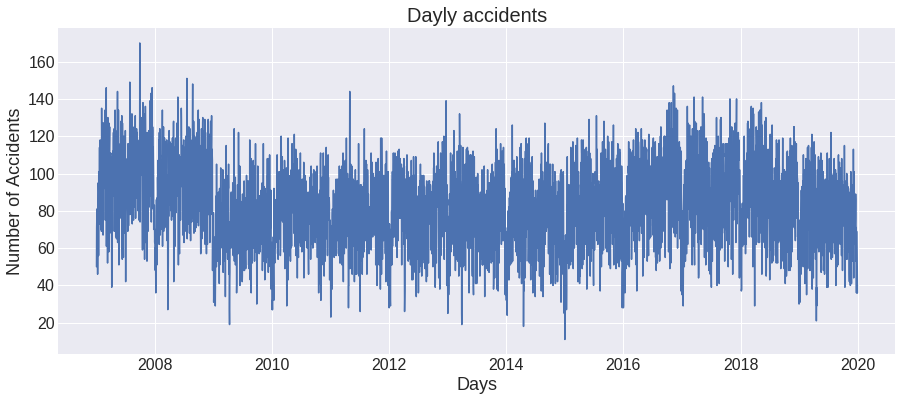

In [41]:
fig = plt.figure()
plt.plot(by_date.date, by_date.accident_count, color='b')
plt.title('Dayly accidents', fontsize =20)
plt.xlabel('Days')
#plt.xticks( ticks, rotation=90)
plt.ylabel('Number of Accidents')
plt.show()

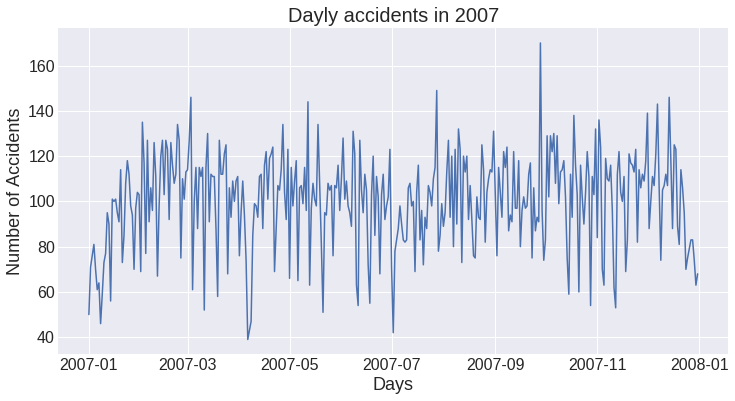

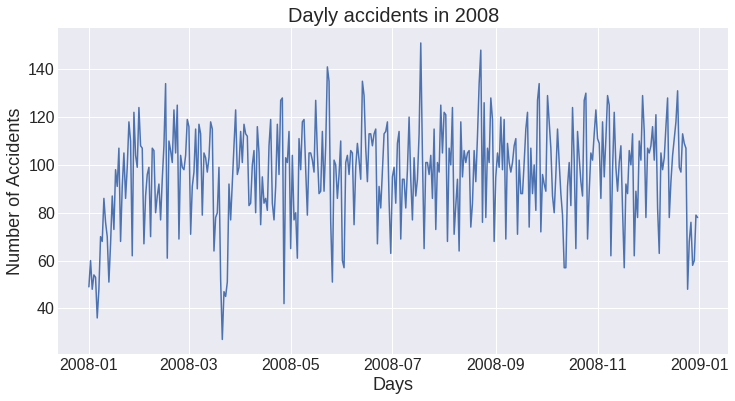

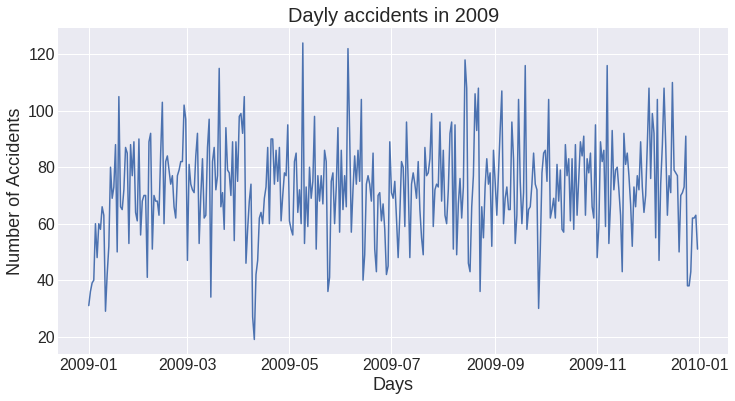

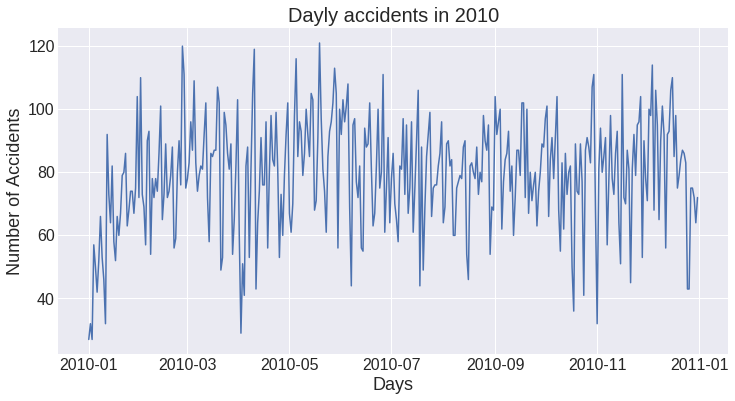

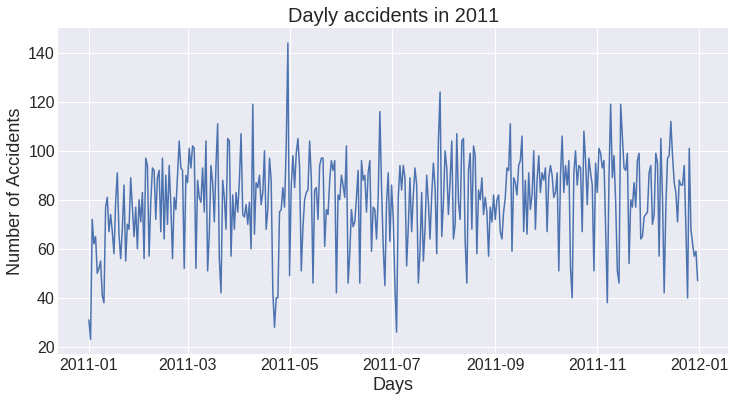

...

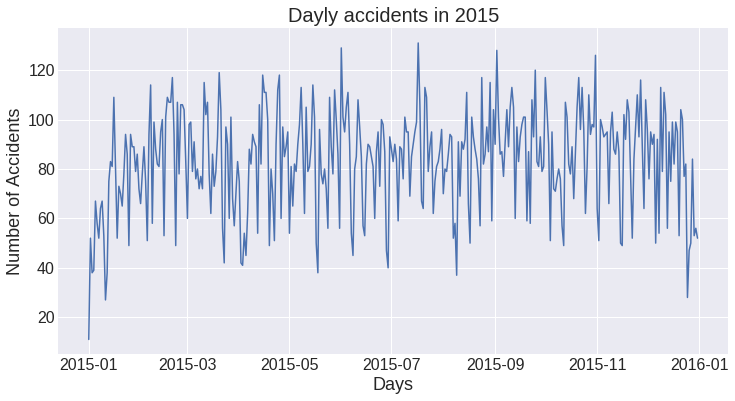

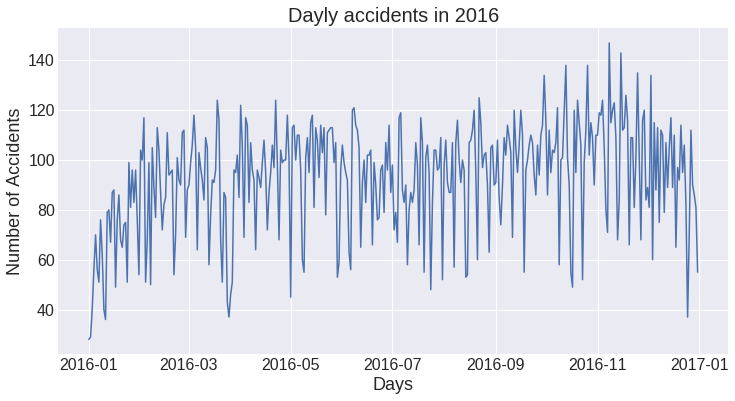

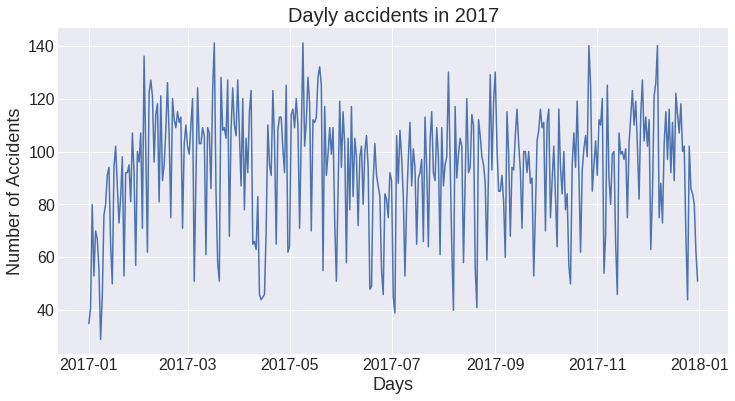

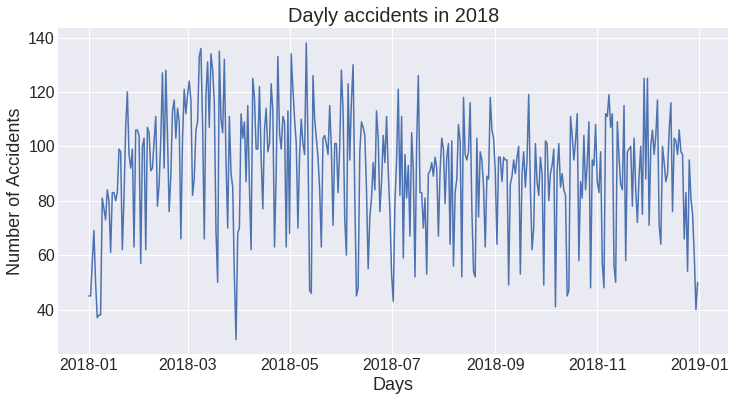

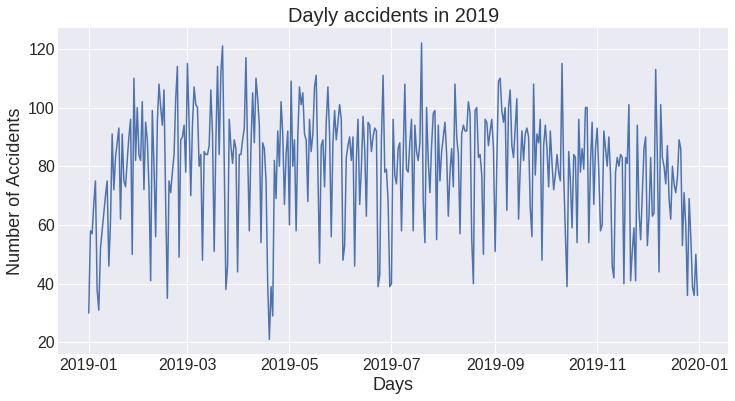

In [42]:
for year in years:
    fig = plt.figure(figsize = (12,6))
    plt.plot(by_date[by_date.date.dt.year == year].date, by_date[by_date.date.dt.year == year].accident_count, color='b')
    plt.title(f'Dayly accidents in {year}', fontsize =20)
    plt.xlabel('Days')
    #plt.xticks( ticks, rotation=90)
    plt.ylabel('Number of Accidents')
    plt.show()
    

### Accidents by year

In [43]:
by_year=accidents['year'].value_counts(sort=True).rename_axis('year').reset_index(name='accident_count').sort_values(by='year').reset_index(drop=True)
by_year

,year,accident_count
0,2007,36514
1,2008,35189
2,2009,26446
3,2010,28977
4,2011,29054
5,2012,29700
6,2013,29716
7,2014,28868
8,2015,30429
9,2016,33992


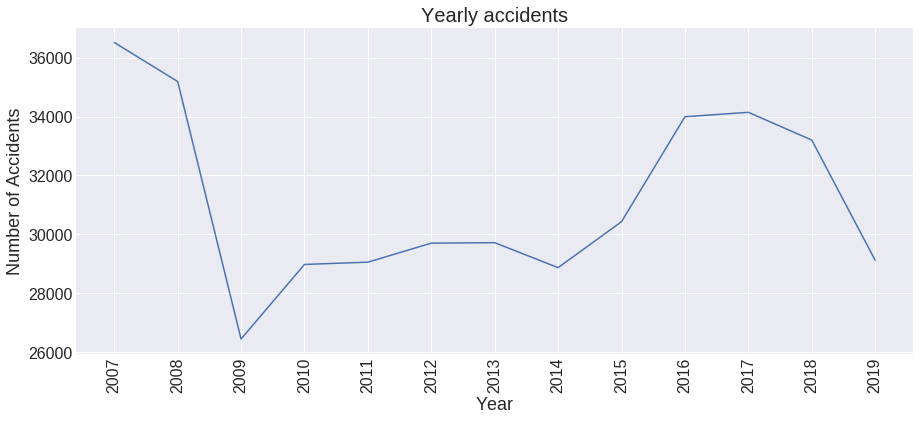

In [44]:
fig = plt.figure()
ticks = [x for x in range(2007, 2020)]
sns.lineplot(by_year.year, by_year.accident_count, color='b')
plt.title('Yearly accidents', fontsize =20)
plt.xlabel('Year')
plt.xticks( ticks, rotation=90)
plt.ylabel('Number of Accidents')
plt.show()

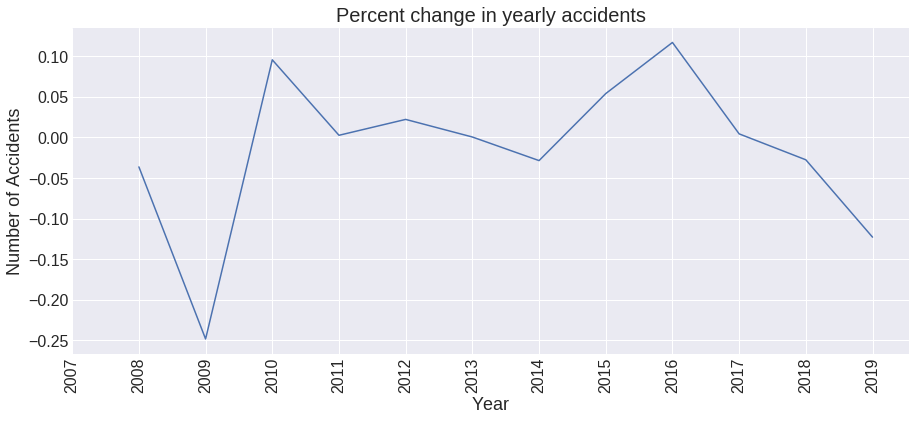

In [45]:
by_year['percent_change'] = by_year.accident_count.pct_change()
sns.lineplot(by_year.year, by_year.percent_change, color='b')
plt.title('Percent change in yearly accidents', fontsize =20)
plt.xlabel('Year')
plt.xticks( ticks, rotation=90)
plt.ylabel('Number of Accidents')
plt.show()

### Accidents by hour

In [46]:
# Hourly accidents
accidents['hour']=accidents.timestamp.dt.hour
by_hour = accidents[['hour','accident_id']].groupby(['hour']).count().reset_index().sort_values(by='hour')
by_hour = by_hour.reset_index(drop=True)
by_hour.rename(columns={'accident_id':'accident_count'}, inplace=True)
by_hour

,hour,accident_count
0,0,4772
1,1,4035
2,2,3578
3,3,4164
4,4,4620
5,5,10646
6,6,19220
7,7,24824
8,8,22993
9,9,20269


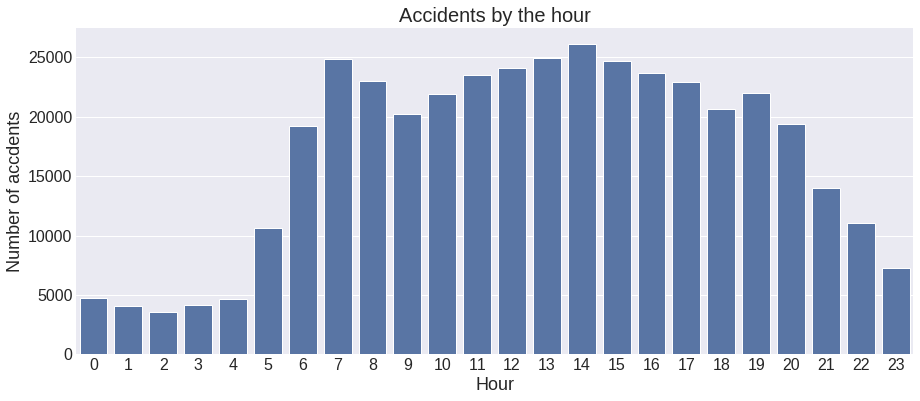

In [47]:
fig = plt.figure()
sns.barplot(by_hour.hour, by_hour.accident_count,color= 'b')
plt.title('Accidents by the hour', fontsize =20)
plt.xlabel('Hour')
plt.ylabel('Number of accdents')
plt.show()

### Accidents by month

In [48]:
accidents['month_name'] = accidents.timestamp.dt.strftime('%b')
accidents['month'] = accidents.timestamp.dt.month
by_month = accidents[['month', 'month_name','accident_id']].groupby(['month','month_name']).count().reset_index().sort_values(by='month')
by_month = by_month.reset_index(drop=True)
by_month.rename(columns={'accident_id':'accident_count'}, inplace=True)
by_month.accident_count = by_month.accident_count/(accidents.timestamp.dt.daysinmonth * (accidents.timestamp.dt.year.max() -accidents.timestamp.dt.year.min())) 
by_month

,month,month_name,accident_count
0,1,Jan,76.887097
1,2,Feb,91.563889
2,3,Mar,102.106322
3,4,Apr,99.535714
4,5,May,97.000000
5,6,Jun,90.852778
6,7,Jul,89.876344
7,8,Aug,93.198925
8,9,Sep,99.413793
9,10,Oct,104.773810


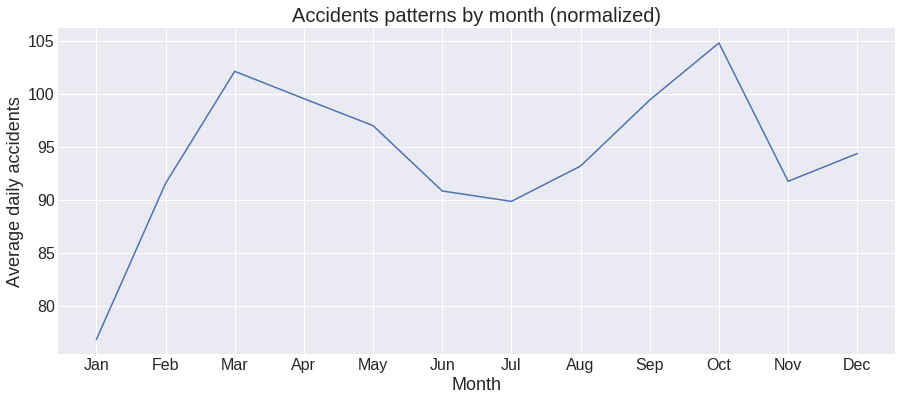

In [49]:
fig = plt.figure()
plt.plot(by_month.month_name, by_month.accident_count, color='b')
plt.title('Accidents patterns by month (normalized)', fontsize=20)
plt.xlabel('Month')
plt.ylabel('Average daily accidents')
plt.show()

### Accidents by day

In [50]:
accidents['day'] = accidents.timestamp.dt.dayofweek.astype('category')
accidents['day'] = accidents.day.cat.rename_categories(["Mon","Tue","Wed","Thu","Fri","Sat","Sun"])
by_day = (accidents[['day','accident_id']]
          .groupby(['day']).count()
          .reset_index()
          .sort_values(by='accident_id', ascending=False))
by_day.rename(columns={'accident_id':'accident_count'}, inplace=True)
by_day['accident_count'] = by_day['accident_count'] /pd.date_range(accidents.timestamp.dt.date.min(), accidents.timestamp.dt.date.max(),freq="D").dayofweek.value_counts()[::-1]
by_day

,day,accident_count
4,Fri,96.146018
5,Sat,92.796460
1,Tue,91.120766
2,Wed,89.461652
3,Thu,87.656342
0,Mon,80.880707
6,Sun,59.542773


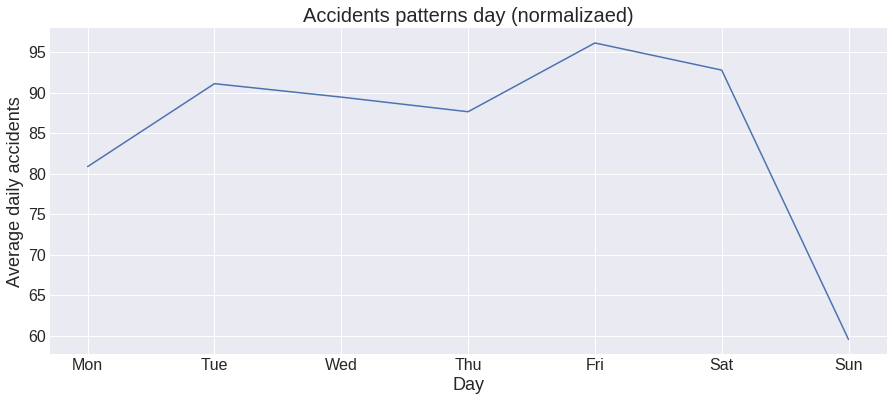

In [51]:
fig = plt.figure()
sns.lineplot(by_day.day, by_day.accident_count, color='b')
plt.title('Accidents patterns day (normalizaed)', fontsize=20)
plt.xlabel('Day')
plt.ylabel('Average daily accidents')
plt.show()

In [52]:
ct_day_month = pd.crosstab(accidents.month, accidents.day)
ct_day_month.index = [calendar.month_abbr[x] for x in ct_day_month.index ]
ct_day_month

day,Mon,Tue,Wed,Thu,Fri,Sat,Sun
Jan,4040,4482,4381,4233,4452,4205,2809
Feb,4915,4798,4957,4353,5485,5192,3263
Mar,4582,5458,5174,5267,5862,5723,3467
Apr,5092,5104,5020,4744,5013,5135,3336
May,4677,5505,5438,5533,5924,5509,3498
Jun,3862,5055,4942,4827,5468,5302,3251
Jul,4565,5324,4892,4885,5268,5060,3440
Aug,4570,5096,5307,5080,5793,5420,3404
Sep,4885,5079,4988,5012,5533,5491,3608
Oct,4780,5452,5396,5325,5559,5357,3335


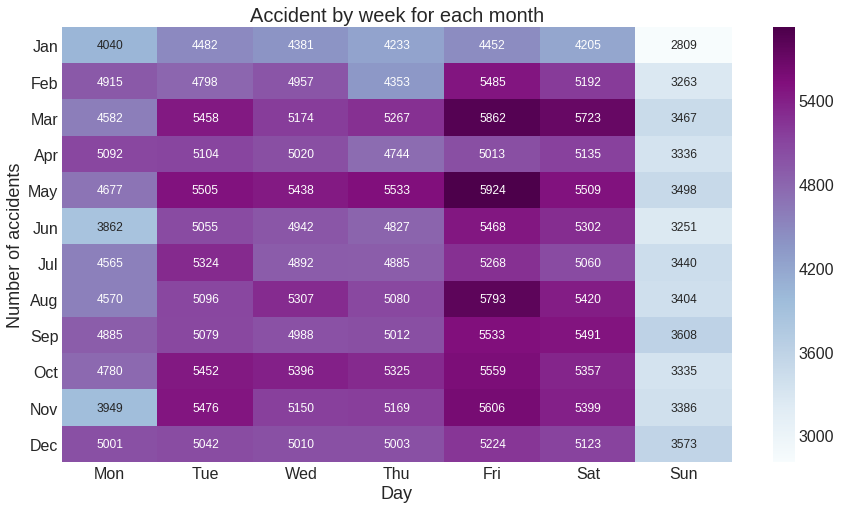

In [53]:
fig = plt.figure(figsize=(15,8))
map1 = sns.heatmap(ct_day_month, annot=True, fmt="d", cmap='BuPu')
plt.title('Accident by week for each month', fontsize=20)
plt.xlabel('Day')
plt.ylabel('Number of accidents')
plt.yticks(rotation=0)
plt.show()

In [54]:
ct_hour_day = pd.crosstab(accidents.hour, accidents.day)
ct_hour_day

day,Mon,Tue,Wed,Thu,Fri,Sat,Sun
hour,,,,,,,
0,410,441,487,596,703,1068,1067
1,346,279,348,448,584,1071,959
2,296,211,284,392,483,908,1004
3,327,231,327,385,498,1127,1269
4,521,467,540,571,669,939,913
5,1594,1658,1665,1687,1782,1316,944
6,2805,3354,3273,3174,3365,1990,1259
7,3708,4299,4385,4148,4038,2831,1415
8,3185,4114,3818,3632,3732,3104,1408


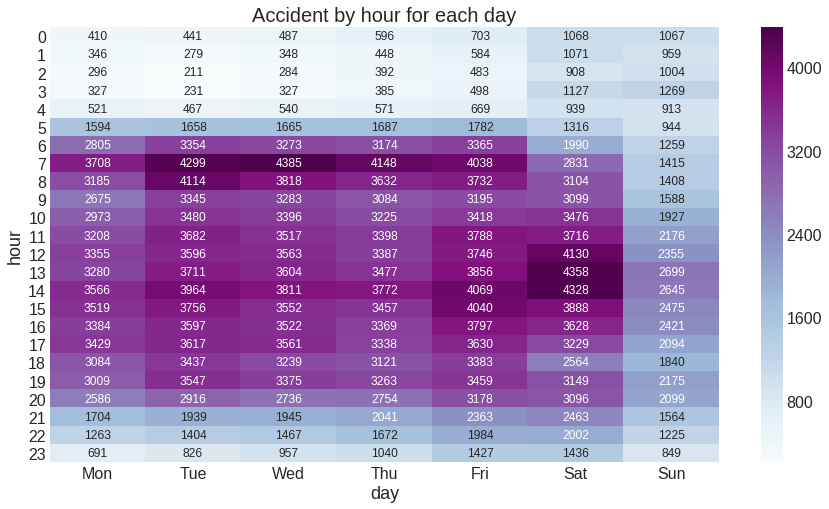

In [55]:
fig = plt.figure(figsize=(15,8))
map1 = sns.heatmap(ct_hour_day, annot=True, fmt="d", cmap='BuPu')
plt.title('Accident by hour for each day', fontsize=20)
plt.yticks(rotation=0)
plt.show()

### By borough

In [56]:
by_borough = accidents[['borough','accident_id']].groupby(['borough']).count().reset_index().sort_values(by='accident_id',ascending=False)
by_borough = by_borough.reset_index(drop=True)
by_borough.rename(columns={'accident_id':'accident_count'}, inplace=True)
by_borough

,borough,accident_count
0,USAQUEN,43738
1,KENNEDY,42410
2,ENGATIVA,41993
3,SUBA,39251
4,FONTIBON,30232
5,PUENTE ARANDA,30015
6,CHAPINERO,29886
7,TEUSAQUILLO,24433
8,BARRIOS UNIDOS,23938
9,LOS MARTIRES,14916


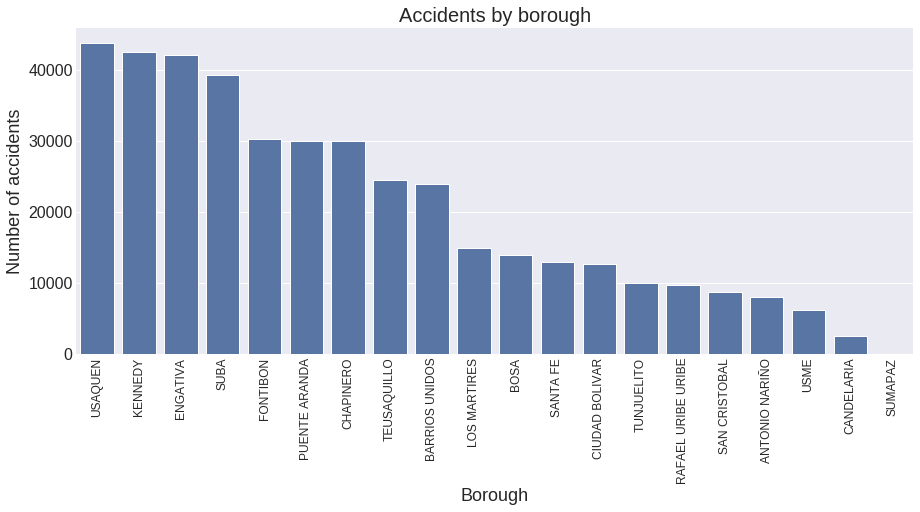

In [57]:
fig = plt.figure()
sns.barplot(by_borough.borough, by_borough.accident_count, color='b')
plt.title('Accidents by borough', fontsize=20)
plt.xlabel('Borough')
plt.xticks(rotation=90, fontsize=12)
plt.ylabel('Number of accidents')
plt.show()

### Accident type

In [58]:
by_type = accidents[['accident_type','accident_id']].groupby(['accident_type']).count().reset_index().sort_values(by='accident_id',ascending=False)
by_type = by_type.reset_index(drop=True)
by_type.rename(columns={'accident_id':'accident_count'}, inplace=True)
by_type

,accident_type,accident_count
0,Crash,338284
1,Run over,45333
2,Occupant fall,8452
3,Other,5697
4,Rollover,4824
5,Self injury,2535
6,Fire,40


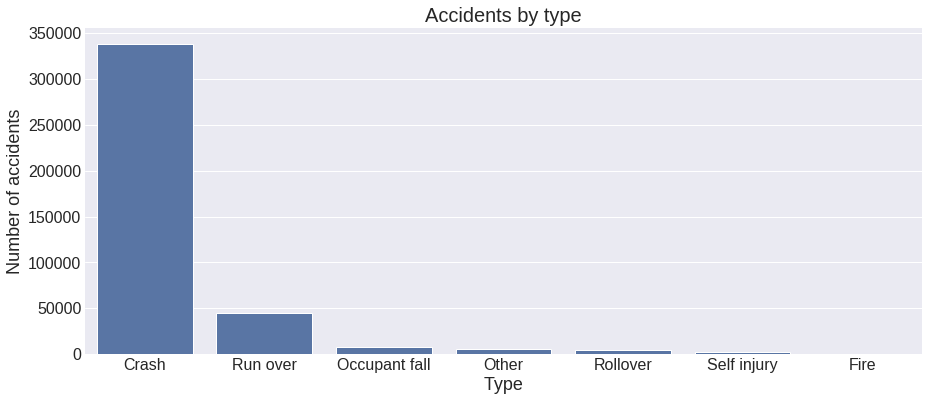

In [59]:
fig = plt.figure()
sns.barplot(by_type.accident_type, by_type.accident_count, color='b')
plt.title('Accidents by type', fontsize=20)
plt.xlabel('Type')
#plt.yscale('log')
plt.ylabel('Number of accidents')
plt.show()

In [60]:
by_severity = accidents[['severity','accident_id']].groupby(['severity']).count().reset_index().sort_values(by='accident_id',ascending=False)
by_severity = by_severity.reset_index(drop=True)
by_severity.rename(columns={'accident_id':'accident_count'}, inplace=True)
by_severity

,severity,accident_count
0,Material damage,269353
1,Injury,130321
2,Fatality,5674


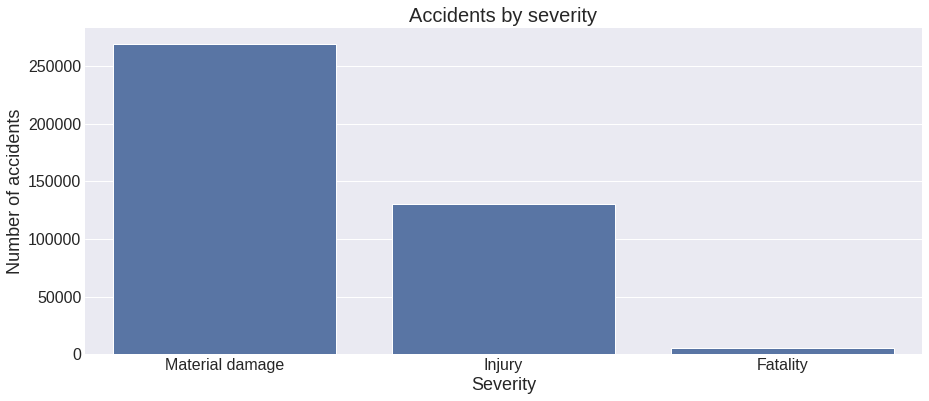

In [61]:
fig = plt.figure()
sns.barplot(by_severity.severity, by_severity.accident_count, color='b')
plt.title('Accidents by severity', fontsize=20)
plt.xlabel('Severity')
#plt.yscale('log')
plt.ylabel('Number of accidents')
plt.show()

In [62]:
minor_accidents = pd.DataFrame(accidents[accidents.severity == 'Material damage']
                               .groupby('accident_type')
                               .accident_id.count())
minor_accidents.rename(columns={'accident_id':'accident_count'}, inplace=True)
minor_accidents = minor_accidents.reset_index()
minor_accidents

,accident_type,accident_count
0,Crash,267917
1,Fire,31
2,Occupant fall,24
3,Other,517
4,Rollover,685
5,Run over,27
6,Self injury,6


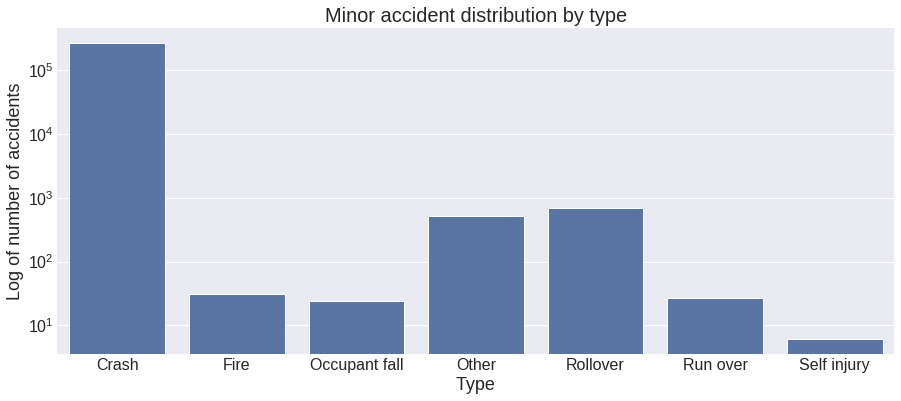

In [63]:
fig = plt.figure()
sns.barplot(minor_accidents.accident_type, minor_accidents.accident_count, color='b')
plt.title('Minor accident distribution by type', fontsize=20)
plt.xlabel('Type')
plt.yscale('log')
plt.ylabel('Log of number of accidents')
plt.show()

In [64]:
medium_accidents = pd.DataFrame(accidents[accidents.severity == 'Injury']
                               .groupby('accident_type')
                               .accident_id.count())
medium_accidents.rename(columns={'accident_id':'accident_count'}, inplace=True)
medium_accidents = medium_accidents.reset_index()
medium_accidents

,accident_type,accident_count
0,Crash,68018
1,Fire,9
2,Occupant fall,8292
3,Other,5134
4,Rollover,3840
5,Run over,42480
6,Self injury,2514


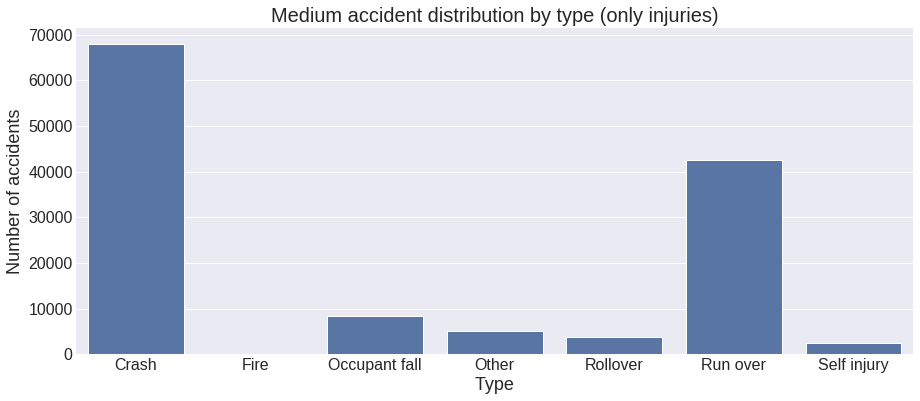

In [65]:
fig = plt.figure()
sns.barplot(medium_accidents.accident_type, medium_accidents.accident_count, color='b')
plt.title('Medium accident distribution by type (only injuries)', fontsize=20)
plt.xlabel('Type')
#.yscale('log')
plt.ylabel('Number of accidents')
plt.show()

In [66]:
severe_accidents = pd.DataFrame(accidents[accidents.severity == 'Fatality']
                               .groupby('accident_type')
                               .accident_id.count())
severe_accidents.rename(columns={'accident_id':'accident_count'}, inplace=True)
severe_accidents = severe_accidents.reset_index()
severe_accidents

,accident_type,accident_count
0,Crash,2349
1,Occupant fall,136
2,Other,46
3,Rollover,299
4,Run over,2826
5,Self injury,15


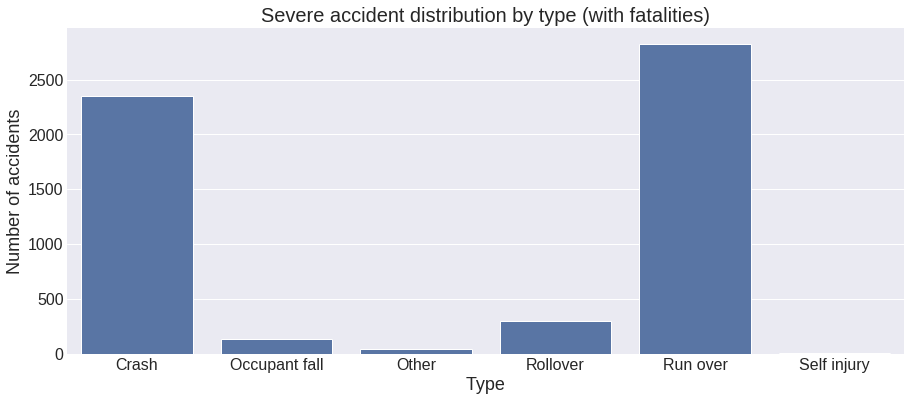

In [89]:
fig = plt.figure()
sns.barplot(severe_accidents.accident_type, severe_accidents.accident_count, color='b')
plt.title('Severe accident distribution by type (with fatalities)', fontsize=20)
plt.xlabel('Type')
#.yscale('log')
plt.ylabel('Number of accidents')
plt.show()

In [69]:
conditions = [
    accidents['severity'].eq('Fatality'),
    accidents['severity'].eq('Injury') & accidents['accident_type'].eq('Run over'),
    accidents['severity'].eq('Injury') & (accidents['accident_type'].eq('Rollover') | accidents['accident_type'].eq('Fire') | accidents['accident_type'].eq('Crash')),
    accidents['severity'].eq('Injury') & (accidents['accident_type'].eq('Occupant fall') | accidents['accident_type'].eq('Self injury')) ,
    accidents['severity'].eq('Injury') & accidents['accident_type'].eq('Other'), 
    accidents['severity'].eq('Material damage') & accidents['accident_type'].eq('Run over'), 
    accidents['severity'].eq('Material damage') & accidents['accident_type'].eq('Rollover'),
    accidents['severity'].eq('Material damage') & accidents['accident_type'].eq('Fire'),
    accidents['severity'].eq('Material damage') & (accidents['accident_type'].eq('Occupant fall') | accidents['accident_type'].eq('Self injury')),
    accidents['severity'].eq('Material damage') & (accidents['accident_type'].eq('Crash')| accidents['accident_type'].eq('Other'))
]
choicelist = [i for i in range(1,11)]
accidents['severity_numeric'] = np.select(conditions, choicelist[::-1])
accidents[(accidents.severity == 'Material damage') & (accidents.accident_type != 'Crash')][['severity','accident_type','severity_numeric']].tail()

,severity,accident_type,severity_numeric
405063,Material damage,Rollover,4
405123,Material damage,Rollover,4
405197,Material damage,Run over,5
405308,Material damage,Other,1
405331,Material damage,Other,1


In [70]:
accidents[accidents.severity_numeric == 0]

,x,y,object_id,form,accident_id,year,address,severity,accident_type,borough_geo,borough,timestamp,civ,pk,date,hour,month_name,month,day,severity_numeric
125,-74.075536,4.664511,1126,727639900,39096,2007,AV CIUDAD DE QUITO-CL 69 0,Material damage,NaN,BARRIOS UNIDOS,BARRIOS UNIDOS,2007-09-25 20:05:00+00:00,12002045.0,35893.0,2007-09-25,20,Sep,9,Tue,0
9621,-74.064431,4.643908,10622,840010100,292297,2008,CL 57-13 02,Injury,NaN,CHAPINERO,CHAPINERO,2008-06-27 12:25:00+00:00,2002211.0,31778.0,2008-06-27,12,Jun,6,Fri,0
10872,-74.041560,4.779383,11873,728149300,44165,2007,AU NORTE-220 0,Material damage,NaN,USAQUEN,USAQUEN,2007-11-09 18:30:00+00:00,1006455.0,2976.0,2007-11-09,18,Nov,11,Fri,0
11646,-74.069099,4.648431,12647,840141900,293555,2008,AC 60-18A 48,Material damage,NaN,TEUSAQUILLO,CIUDAD BOLIVAR,2008-06-30 01:35:00+00:00,13000403.0,32394.0,2008-06-30,1,Jun,6,Mon,0
16206,-74.089225,4.680316,16207,728093900,43619,2007,KR 69-71,Material damage,NaN,ENGATIVA,ENGATIVA,2007-11-02 17:30:00+00:00,10008472.0,41937.0,2007-11-02,17,Nov,11,Fri,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369661,-74.103390,4.599371,371066,728726100,49377,2007,CL 1A-30,Material damage,NaN,LOS MARTIRES,PUENTE ARANDA,2007-12-29 08:35:00+00:00,14001143.0,240448.0,2007-12-29,8,Dec,12,Sat,0
370833,-74.096357,4.685622,375238,828659300,432,2008,AV BOYACA-CL 70 89,Material damage,NaN,ENGATIVA,ENGATIVA,2008-01-12 19:10:00+00:00,10007937.0,42191.0,2008-01-12,19,Jan,1,Sat,0
370912,-74.071954,4.668912,375317,728000500,42690,2007,AV CIUDAD DE QUITO-CL 74,Material damage,NaN,BARRIOS UNIDOS,BARRIOS UNIDOS,2007-10-26 11:15:00+00:00,12001580.0,38055.0,2007-10-26,11,Oct,10,Fri,0
375972,-74.062777,4.645109,377377,833950800,3831,2008,CL 59-SUR 2,Material damage,NaN,CHAPINERO,BOSA,2008-02-29 13:00:00+00:00,2001516.0,32363.0,2008-02-29,13,Feb,2,Fri,0


In [71]:
accidents.groupby('severity_numeric').count()

,x,y,object_id,form,accident_id,year,address,severity,accident_type,borough_geo,borough,timestamp,civ,pk,date,hour,month_name,month,day
severity_numeric,,,,,,,,,,,,,,,,,,,
0,180,180,180,180,180,180,180,180,0,180,180,180,179,178,180,180,180,180,180
1,268434,268434,268434,268434,268434,268434,268434,268434,268434,268434,268434,268434,266859,262050,268434,268434,268434,268434,268434
2,30,30,30,30,30,30,30,30,30,30,30,30,29,29,30,30,30,30,30
3,31,31,31,31,31,31,31,31,31,31,31,31,30,30,31,31,31,31,31
4,685,685,685,685,685,685,685,685,685,685,685,685,679,656,685,685,685,685,685
5,27,27,27,27,27,27,27,27,27,27,27,27,27,25,27,27,27,27,27
6,5134,5134,5134,5134,5134,5134,5134,5134,5134,5134,5134,5134,5093,4999,5134,5134,5134,5134,5134
7,10806,10806,10806,10806,10806,10806,10806,10806,10806,10806,10806,10806,10752,10550,10806,10806,10806,10806,10806
8,71867,71867,71867,71867,71867,71867,71867,71867,71867,71867,71867,71867,71579,69820,71867,71867,71867,71867,71867


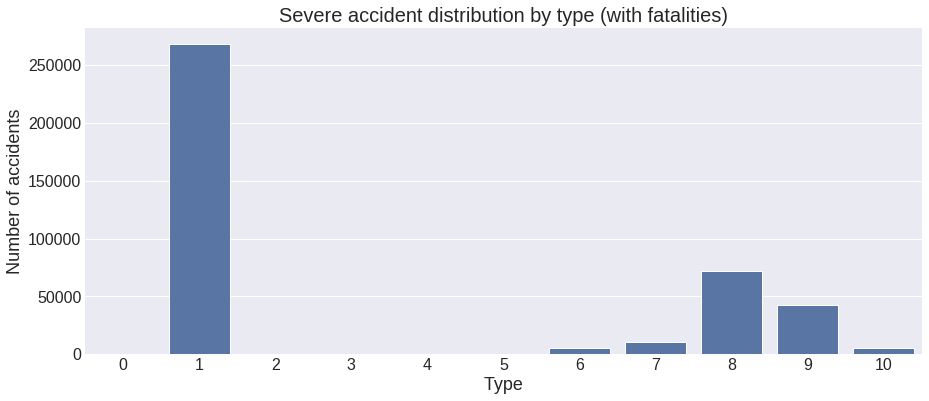

In [88]:
fig = plt.figure()
sns.countplot(accidents.severity_numeric, color='b')
plt.title('Severe accident distribution by type (with fatalities)', fontsize=20)
plt.xlabel('Type')
#.yscale('log')
plt.ylabel('Number of accidents')
plt.show()

## Geography

### Bogota Map

In [73]:
accident_sample = accidents.sample(frac=0.02, random_state=1)

In [74]:
folium_map = folium.Map(location=[4.654335, -74.083644],
                        zoom_start=12,
                        tiles="openstreetmap")
for row in accident_sample.iterrows():
    if row[1]['severity']== 'Material damage':
        marker = folium.CircleMarker(location=[row[1]['y'],row[1]['x']], radius=2, color="green", fill=True)
        marker.add_to(folium_map)
    elif row[1]['severity']== 'Injury':
        marker = folium.CircleMarker(location=[row[1]['y'],row[1]['x']], radius=2, color="blue", fill=True)
        marker.add_to(folium_map)
    elif row[1]['severity']== 'Fatality':
        # marker = folium.CircleMarker(location=[row[1]['y'],row[1]['x']], radius=2, color="red", fill=True)
        marker = folium.Marker(
            location=[row[1]['y'],row[1]['x']],
            icon=folium.Icon(color='red', prefix='fa'),
        )
        marker.add_to(folium_map)

In [75]:
from branca.element import Template, MacroElement

template = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
  <script>
  $( function() {
    $( "#maplegend" ).draggable({
                    start: function (event, ui) {
                        $(this).css({
                            right: "auto",
                            top: "auto",
                            bottom: "auto"
                        });
                    }
                });
});

  </script>
</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Accident severity</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:red;opacity:0.7;'></span>Fatality</li>
    <li><span style='background:blue;opacity:0.7;'></span>Injury</li>
    <li><span style='background:green;opacity:0.7;'></span>Material damage</li>

  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

macro = MacroElement()
macro._template = Template(template)

folium_map.get_root().add_child(macro)

folium_map

In [76]:
borough_file = os.path.join(data_folder, 'poligonos-localidades.geojson')
borough_df = geopandas.read_file(borough_file, driver= "GeoJSON")
borough_df.drop(columns = ['Acto administrativo de la localidad', 'Area de la localidad'], inplace=True)
borough_df.rename(columns={'Nombre de la localidad':'borough', 'Area de la localidad':'area',
                           'Identificador unico de la localidad':'id' }, inplace=True)

In [77]:
borough_info = os.path.join(data_folder, 'localidades.csv')
borough_info = pd.read_csv(borough_info, header=0, dtype='str')
borough_info.area_km2 = borough_info.area_km2.astype('float')
borough_info.population = borough_info.population.astype('int')
borough_info.population_density = borough_info.population_density.astype('float')
borough_info.head()

,id,borough,postal_codes,area_km2,population,population_density
0,01,Usaquén,110111-110151,65.31,501999,7686.40
1,02,Chapinero,110211-110231,38.15,139701,3661.88
2,03,SantaFe,110311-110321,45.17,110048,2436.30
3,04,SanCristóbal,110411-110441,49.09,404697,8243.98
4,05,Usme,110511-110571,215.06,457302,2126.39


In [78]:
borough_df = borough_df.merge(borough_info, how='inner', left_on='id', right_on='id')


In [79]:
borough_df.drop(columns = ['borough_y', 'postal_codes'], inplace=True)
borough_df.rename(columns={'borough_x':'borough'}, inplace=True)

In [80]:
borough_df.columns

Index(['borough', 'id', 'geometry', 'area_km2', 'population',
       'population_density'],
      dtype='object')

In [81]:
set(accidents.borough.unique()) - set(borough_df['borough'].unique())

set()

In [82]:
borough_data = borough_df.merge(by_borough, how='left', left_on='borough', right_on='borough')
borough_data.head(3)

,borough,id,geometry,area_km2,population,population_density,accident_count
0,CIUDAD BOLIVAR,19,"MULTIPOLYGON (((-74.18135 4.58892, -74.18092 4...",130.00,707569,5442.83,12675
1,SUBA,11,"MULTIPOLYGON (((-74.03450 4.82547, -74.03489 4...",100.56,1218513,12117.27,39251
2,RAFAEL URIBE URIBE,18,"MULTIPOLYGON (((-74.12803 4.59254, -74.12829 4...",13.83,374246,27060.44,9730


In [83]:
borough_data['accident_density'] = round(borough_data.accident_count/borough_data.area_km2, 1)

In [84]:
# color scheme
color_map = plt.cm.get_cmap('BuPu', 12)
min_cn, max_cn = by_borough['accident_count'].quantile([0.01,0.99]).apply(round, 2)

colormap = branca.colormap.LinearColormap(
    colors=tuple(map(tuple, color_map(np.linspace(0, 1, 12)))),
    vmin=min_cn,
    vmax=max_cn
)

colormap.caption="Accidents in Bogota by borough"

In [85]:
folium_map = folium.Map(location=[4.500335, -74.083644],
                        zoom_start=10,
                        tiles="openstreetmap")

style_function = lambda x: {
    'fillColor': colormap(x['properties']['accident_count']),
    'color': 'black',
    'weight':2,
    'fillOpacity':0.7
}

bgeo = folium.GeoJson(
    borough_data.to_json(),
    name='Bogota boroughs',
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['borough', 'accident_count'],
        aliases=['Borough', 'Total accidents'], 
        localize=True
    )
).add_to(folium_map)

colormap.add_to(folium_map)
folium_map

In [86]:
# color scheme
color_map = plt.cm.get_cmap('BuPu', 12)
min_cn, max_cn = borough_data['accident_density'].quantile([0.01,0.99]).apply(round, 2)

colormap = branca.colormap.LinearColormap(
    colors=tuple(map(tuple, color_map(np.linspace(0, 1, 12)))),
    vmin=min_cn,
    vmax=max_cn
)

colormap.caption="Accident density in Bogota by borough"

In [87]:
folium_map = folium.Map(location=[4.510335, -74.083644],
                        zoom_start=10,
                        tiles="openstreetmap")

style_function = lambda x: {
    'fillColor': colormap(x['properties']['accident_density']),
    'color': 'black',
    'weight':2,
    'fillOpacity':0.7
}

bgeo = folium.GeoJson(
    borough_data.to_json(),
    name='Bogota boroughs',
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['borough', 'accident_density'],
        aliases=['Borough', 'Accidents per sq. km'], 
        localize=True
    )
).add_to(folium_map)

colormap.add_to(folium_map)
folium_map